In [90]:
import pandas as pd
import os
import numpy as np
import geopandas as gpd
import seaborn as sns
from wordcloud import WordCloud, ImageColorGenerator
from collections import Counter
import pylab as pl
from matplotlib import figure
import matplotlib.colors as mcolors
%matplotlib notebook
%matplotlib inline
import plotly.offline as pyo
pyo.init_notebook_mode()
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 200
from matplotlib.pyplot import figure

# Loading the dataset

In [91]:
inputs_path = '/Users/arezoufarzaneh/Downloads/SC/inputs'


# https://data.wprdc.org/dataset/allegheny-county-fatal-accidental-overdoses
fao_f_name = 'Fatal_Accidental_Overdoses.csv'
fao_f_path = os.path.join(inputs_path, fao_f_name)

# https://data.wprdc.org/dataset/allegheny-county-zip-code-boundaries2
map_f_name = 'Allegheny_County_Zip_Code_Boundaries.shp'
map_path = os.path.join(inputs_path, 'map', map_f_name)

In [92]:
accident_df = pd.read_csv(fao_f_path)
accident_df['death_date_and_time']= pd.to_datetime(accident_df['death_date_and_time'])
accident_df = accident_df[accident_df['case_year']<2023].reset_index(drop=True)

accident_df.head(5)

,death_date_and_time,manner_of_death,age,sex,race,case_dispo,combined_od1,combined_od2,combined_od3,combined_od4,combined_od5,combined_od6,combined_od7,combined_od8,combined_od9,combined_od10,incident_zip,decedent_zip,case_year
0,2009-02-02 09:42:00,Accident,58,F,W,MO,Alcohol,Cocaine,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15212,NaN,2009
1,2009-02-13 23:02:00,Accident,51,F,B,MO,Diazepam,Fentanyl,Ketamine,Nordiazepam,Norpropoxyphene,Oxycodone,Propoxyphene,NaN,NaN,NaN,15025,NaN,2009
2,2009-02-02 17:07:00,Accidents,53,M,W,MO,Clonazepam,Methadone,Venlafaxine,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15236,NaN,2009
3,2009-02-04 09:08:00,Accidents,54,F,W,MO,Cocaine,Diazepam,Morphine,Nordiazepam,NaN,NaN,NaN,NaN,NaN,NaN,15084,NaN,2009
4,2009-02-05 10:15:00,Accident,52,F,W,MO,Alcohol,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15220,NaN,2009


In [93]:
accident_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6413 entries, 0 to 6412
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   death_date_and_time  6413 non-null   datetime64[ns]
 1   manner_of_death      6413 non-null   object        
 2   age                  6413 non-null   int64         
 3   sex                  6413 non-null   object        
 4   race                 6411 non-null   object        
 5   case_dispo           6413 non-null   object        
 6   combined_od1         6413 non-null   object        
 7   combined_od2         5145 non-null   object        
 8   combined_od3         3430 non-null   object        
 9   combined_od4         1819 non-null   object        
 10  combined_od5         788 non-null    object        
 11  combined_od6         294 non-null    object        
 12  combined_od7         121 non-null    object        
 13  combined_od8         30 non-null 

In [94]:
accident_df.nunique()

death_date_and_time    6388
manner_of_death           2
age                      75
sex                       2
race                      8
case_dispo                1
combined_od1            112
combined_od2            120
combined_od3            107
combined_od4             95
combined_od5             85
combined_od6             66
combined_od7             51
combined_od8             23
combined_od9              7
combined_od10             0
incident_zip            357
decedent_zip              0
case_year                16
dtype: int64

### Loading Allegheny county (ZIP-code regions) map df

In [95]:
map_df = gpd.read_file(map_path)
map_df.head(5)

,OBJECTID,ZIP,NAME,ZIPTYPE,STATE,STATEFIPS,COUNTYFIPS,COUNTYNAME,S3DZIP,LAT,...,MFDU,SFDU,BOXCNT,BIZCNT,RELVER,COLOR,GlobalID,SHAPESTAre,SHAPESTLen,geometry
0,4,15007,BAKERSTOWN,NON-UNIQUE,PA,42,42003,ALLEGHENY,150,40.656688,...,0.0,107.0,66.0,55.0,1.9.3,10.0,{4768B869-6BC2-4B77-8DC7-A3BB678888D1},1.337121e+07,20129.308124,"POLYGON ((-79.92421 40.65181, -79.92422 40.651..."
1,5,15014,BRACKENRIDGE,NON-UNIQUE,PA,42,42003,ALLEGHENY,150,40.607964,...,59.0,1396.0,38.0,76.0,1.9.3,5.0,{D7938129-8427-49A4-8C6C-3A19848432D4},1.515338e+07,16855.546429,"POLYGON ((-79.73317 40.60314, -79.73351 40.603..."
2,6,15015,BRADFORD WOODS,NON-UNIQUE,PA,42,42003,ALLEGHENY,150,40.636452,...,0.0,430.0,95.0,56.0,1.9.3,10.0,{BABB5D5E-1FF4-4E03-BBAB-B84CBB5BFB31},2.613718e+07,33453.262195,"POLYGON ((-80.07258 40.64492, -80.07241 40.644..."
3,8,15018,BUENA VISTA,NON-UNIQUE,PA,42,42003,ALLEGHENY,150,40.289408,...,0.0,286.0,129.0,22.0,1.9.3,11.0,{4E2C2FAA-7976-4BEF-8119-BBB65C2F7014},6.096210e+07,76802.232756,"POLYGON ((-79.78014 40.29274, -79.77960 40.292..."
4,14,15034,DRAVOSBURG,NON-UNIQUE,PA,42,42003,ALLEGHENY,150,NaN,...,0.0,950.0,29.0,104.0,1.9.3,6.0,{C7A863B3-22E1-42B1-A368-872E83B4A9CC},2.935004e+07,26075.246862,"POLYGON ((-79.88627 40.35929, -79.88607 40.359..."


# Allegheny county fatal accidental overdoses trend 

In [96]:
accident_year_df = accident_df.groupby(['case_year']).size().reset_index(name='Accident_year_cnt')
accident_year_df = accident_year_df.sort_values('case_year', ascending=False).reset_index(drop=True)

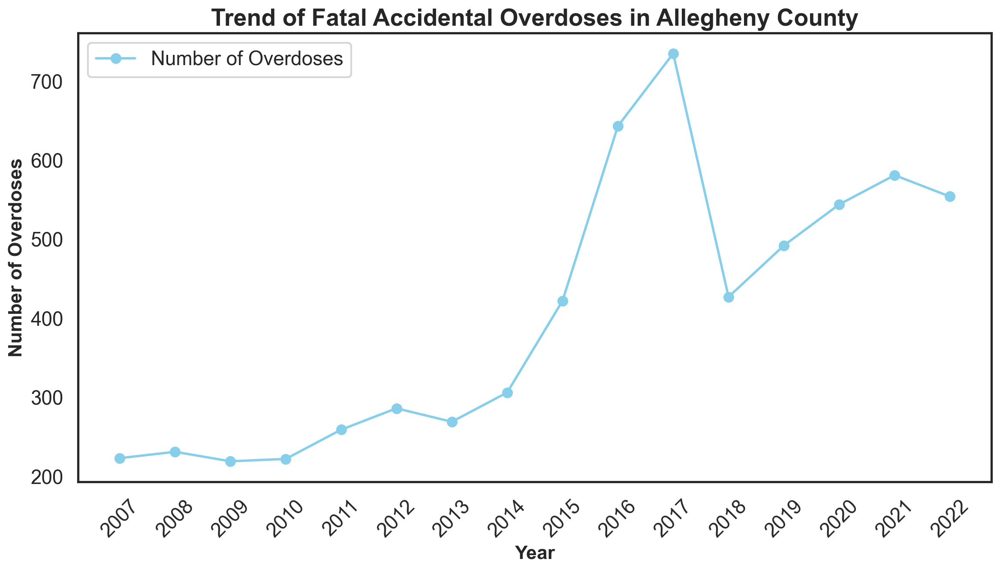

In [98]:
fig, ax = plt.subplots(1, figsize=(12, 7))

# Plotting the data with enhanced line style, color, and markers
plt.plot(accident_year_df['case_year'], accident_year_df['Accident_year_cnt'],
         marker='o', linestyle='-', color='skyblue', linewidth=2, markersize=8)

ax.set_title('Trend of Fatal Accidental Overdoses in Allegheny County', fontsize=20, fontweight='bold')


ax.set_xlabel('Year', fontsize=16, fontweight='bold')
ax.set_ylabel('Number of Overdoses', fontsize=16, fontweight='bold')


ax.set_xticks(accident_year_df['case_year'])


plt.xticks(rotation=45)

plt.legend(['Number of Overdoses'], loc='upper left')

plt.tight_layout()
plt.show()


<b> Observation: </b> As we can see, the number of cases has started to increase till 2017 and after that it dropped. As a result, we choose 2017 as the change point to divide years into two periods.

# Allegheny county fatal accidental overdoses spatial distributions

## Overall

In [99]:

# Computing and merging the total number of accidents per zip code
accident_zip_cnt_df = accident_df.groupby(['incident_zip']).size().reset_index(name='Accident_zip_cnt')
accident_zip_cnt_df = accident_zip_cnt_df.sort_values('Accident_zip_cnt', ascending=False).reset_index(drop=True)
# accident_zip_cnt_df.head(10)

tot_map_df = pd.merge(map_df, accident_zip_cnt_df,  how='left', left_on=['ZIP'], right_on = ['incident_zip'])

tot_map_df['Accident_zip_cnt'] = tot_map_df['Accident_zip_cnt'].fillna(0)
tot_map_df['Accident_zip_cnt'] = tot_map_df['Accident_zip_cnt'].astype('uint')
tot_map_df['Accident_zip_percent'] = (tot_map_df.Accident_zip_cnt / tot_map_df.Accident_zip_cnt.sum()) * 100
tot_map_df['Accident_zip_norm'] = tot_map_df['Accident_zip_cnt'] /tot_map_df['Accident_zip_cnt'].abs().max()
# tot_map_df

df = tot_map_df


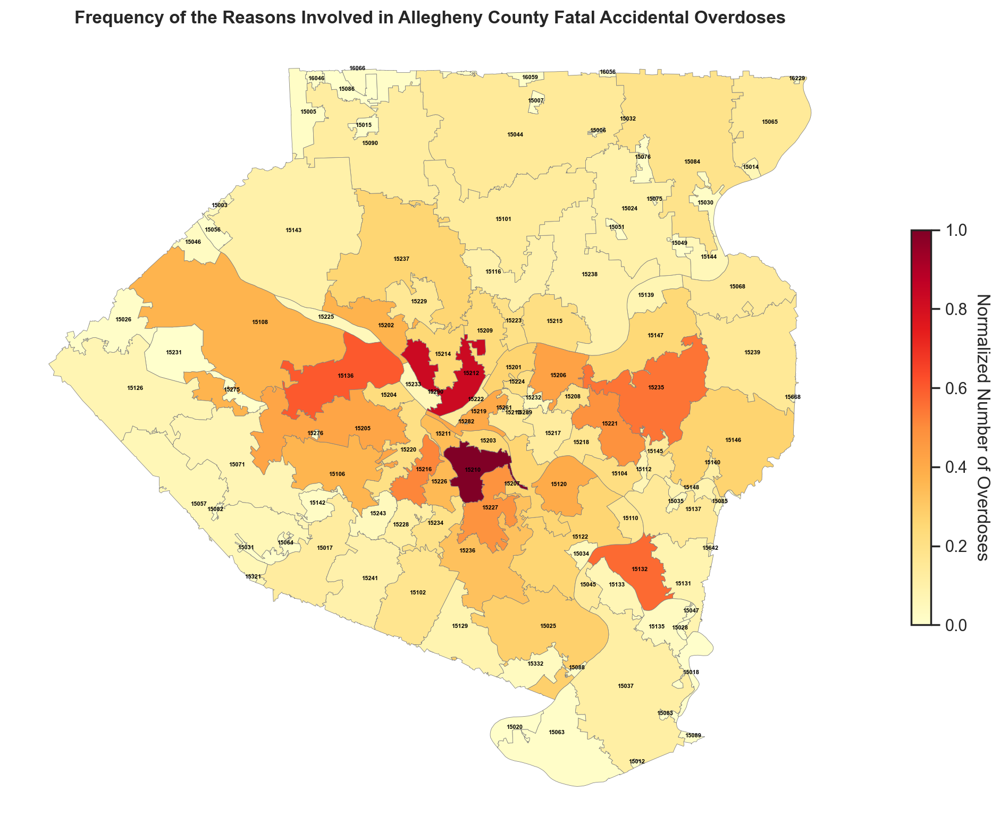

In [157]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

cmap = 'YlOrRd' 
df.plot(column=col, ax=ax, edgecolor='gray', linewidth=0.3, cmap=cmap, legend=False)

norm = mcolors.Normalize(vmin=df[col].min(), vmax=df[col].max())

for idx, row in df.iterrows():
    plt.annotate(text=row['ZIP'], xy=row['geometry'].representative_point().coords[0], 
                 horizontalalignment='center', color='black', fontsize=4, weight='bold')

ax.set_title(title, fontdict={'fontsize': '12', 'fontweight': 'bold'})
ax.axis('off')


sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []
cbar = plt.colorbar(sm, ax=ax, shrink=0.5) 
cbar.set_label('Normalized Number of Overdoses', rotation=270, labelpad=15)

plt.tight_layout()
plt.show()


In [158]:
selected_year = 2017

accident_year_zip_cnt_df = accident_df.groupby(['incident_zip', 'case_year']).size().reset_index(name='Accident_year_zip_cnt')
accident_year_zip_cnt_df = accident_year_zip_cnt_df.sort_values('Accident_year_zip_cnt', ascending=False).reset_index(drop=True)

accident_year_zip_cnt_df_before = accident_year_zip_cnt_df[accident_year_zip_cnt_df['case_year'] < selected_year].reset_index(drop=True)
accident_year_zip_cnt_df_before = accident_year_zip_cnt_df_before.drop('case_year', axis=1)
accident_year_zip_cnt_df_after = accident_year_zip_cnt_df[accident_year_zip_cnt_df['case_year'] >= selected_year].reset_index(drop=True)
accident_year_zip_cnt_df_after = accident_year_zip_cnt_df_after.drop('case_year', axis=1)


df1 = pd.merge(map_df, accident_year_zip_cnt_df_before, how='left', left_on=['ZIP'], right_on = ['incident_zip'])

df1['Accident_year_zip_cnt'] = df1['Accident_year_zip_cnt'].fillna(0)
df1['Accident_year_zip_cnt'] = df1['Accident_year_zip_cnt'].astype('uint')
df1['Accident_zip_norm'] = df1['Accident_year_zip_cnt'] /df1['Accident_year_zip_cnt'].abs().max()


df2 = pd.merge(map_df, accident_year_zip_cnt_df_after, how='left', left_on=['ZIP'], right_on = ['incident_zip'])

df2['Accident_year_zip_cnt'] = df2['Accident_year_zip_cnt'].fillna(0)
df2['Accident_year_zip_cnt'] = df2['Accident_year_zip_cnt'].astype('uint')
df2['Accident_zip_norm'] = df2['Accident_year_zip_cnt'] /df2['Accident_year_zip_cnt'].abs().max()

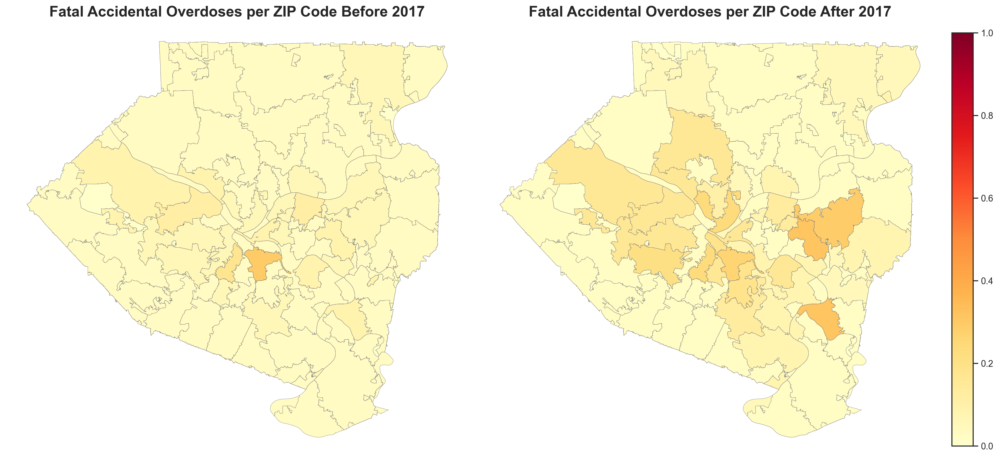

In [159]:
def plot_map(ax, data_frame, column, title, cmap='YlOrRd' ):
    data_frame.plot(column=column, ax=ax, edgecolor='gray', linewidth=0.3, cmap=cmap, legend=False)
    
    norm = mcolors.Normalize(vmin=data_frame[column].min(), vmax=data_frame[column].max())
    

    
    ax.set_title(title, fontdict={'fontsize': '18', 'fontweight': 'bold'})
    ax.axis('off')
    
    return norm

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))

norm = plot_map(ax1, df1, 'Accident_zip_norm', f"Fatal Accidental Overdoses per ZIP Code Before {selected_year}")
plot_map(ax2, df2, 'Accident_zip_norm', f"Fatal Accidental Overdoses per ZIP Code After {selected_year}")

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.9, 0.15, 0.02, 0.7])
sm = plt.cm.ScalarMappable(cmap='YlOrRd' , norm=norm)
sm.set_array([])
fig.colorbar(sm, cax=cbar_ax)

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()


<b> Observartion: </b> As we can see before 2017, most of cases blonged to Pittsburgh area with ZIP code (15210). However, after 2017, the majority of cases belong to Pittsburgh (15235 and 15221) and Mckeesport (15132). Further investigation could provide more insights about this shift from center to the east of county.
Since the numbers are reducing, one might investigate if central blocks of Allegheny have received more attention and consequently their cases have reduced while eastern blocks received less attention or other potential reasons. 


# Age distribution of allegheny county fatal accidental overdoses per various groups 

In [103]:
age_gender_race_df = accident_df[['age', 'sex', 'race', 'case_year']]
age_gender_race_df = age_gender_race_df.rename(columns={'age': 'Age', 'sex': 'Sex', 'race': 'Race', 'case_year': 'Period'})
age_gender_race_df['Period'] = age_gender_race_df['Period'].apply(lambda x: 'Before 2017' if x < selected_year else 'After 2017')
age_gender_race_df = age_gender_race_df.sort_values('Period', ascending=False).reset_index(drop=True)

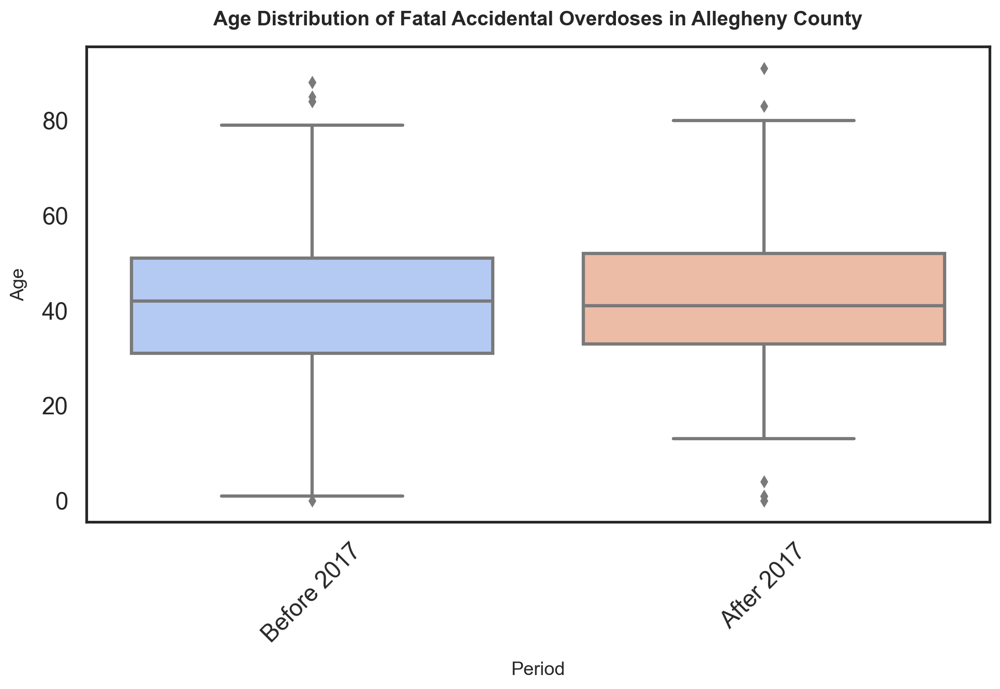

In [104]:

sns.set_style("white")

target_cat = 'Period' 


plt.figure(figsize=(10, 7)) 
sns.boxplot(x=target_cat, y='Age', data=age_gender_race_df, palette="coolwarm")


plt.title('Age Distribution of Fatal Accidental Overdoses in Allegheny County',
          fontsize=14, 
          fontweight='bold', 
          pad=15)

plt.xlabel(target_cat, fontsize=13, labelpad=10) 
plt.ylabel('Age', fontsize=13, labelpad=10)  


plt.xticks(rotation=45)


plt.tight_layout()  
plt.show()


<b> Observartion: </b> Comparing the age distribution of before and after 2017 revels no significant changes in the average of the cases which is around 40.


## Sex per year

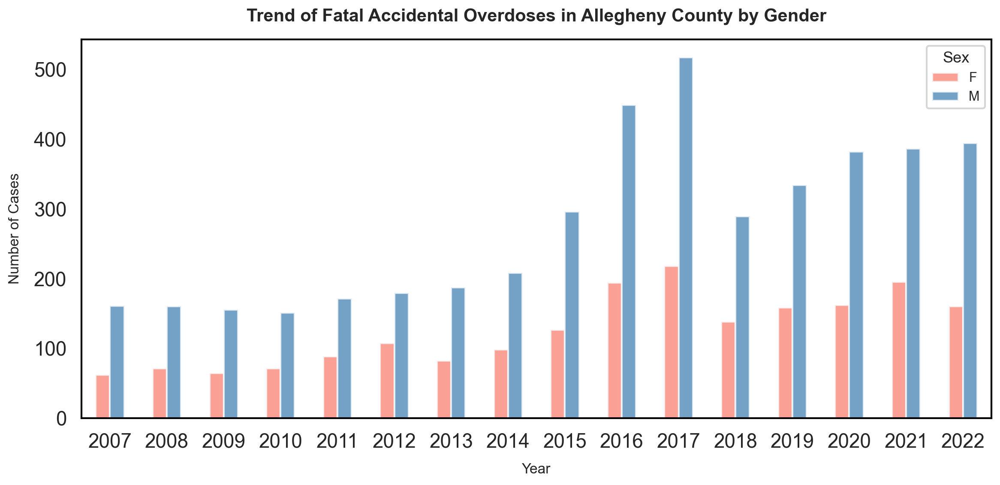

In [105]:
ax = accident_df.groupby(["case_year", "sex"]).size().unstack('sex').plot.bar(
    figsize=(12, 6),alpha=0.75, color=['salmon', 'steelblue'],rot=0)


ax.set_facecolor('white')
ax.grid(False)  


ax.set_title('Trend of Fatal Accidental Overdoses in Allegheny County by Gender',
             fontsize=15, fontweight='bold', pad=15)

ax.set_xlabel('Year', fontsize=12, labelpad=10)
ax.set_ylabel('Number of Cases', fontsize=12, labelpad=10)


ax.legend(title='Sex', title_fontsize='13', fontsize='11')

ax.spines['right'].set_visible(True)
ax.spines['top'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

ax.spines['right'].set_color('black')
ax.spines['top'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')

ax.spines['right'].set_linewidth(1.5)
ax.spines['top'].set_linewidth(1.5)
ax.spines['bottom'].set_linewidth(1.5)
ax.spines['left'].set_linewidth(1.5)

plt.axis()
plt.tight_layout()
plt.show()


<b> Observation: </b> The following shows the time series for the number of incidences with the separation of sex (male and female) in the period between 2007 and 2022. Generally, we can see that the number of accidents is noticeably higher for males than females. Moreover, there is a similar trend between males and females over the years. In the period between 2007 and 20016, the cases are close to 175 for males and 85 for females. After that, we can see a steep increase in the number of cases for males until it reaches 517, but with female cases, there is a minor increase in the number of cases for females where the maximum value is 218. Finally, the trend decreases for males by roughly 30% as well as the female in 2018. Then, there is a minor increase until 2022. 

## Age distribution per Sex

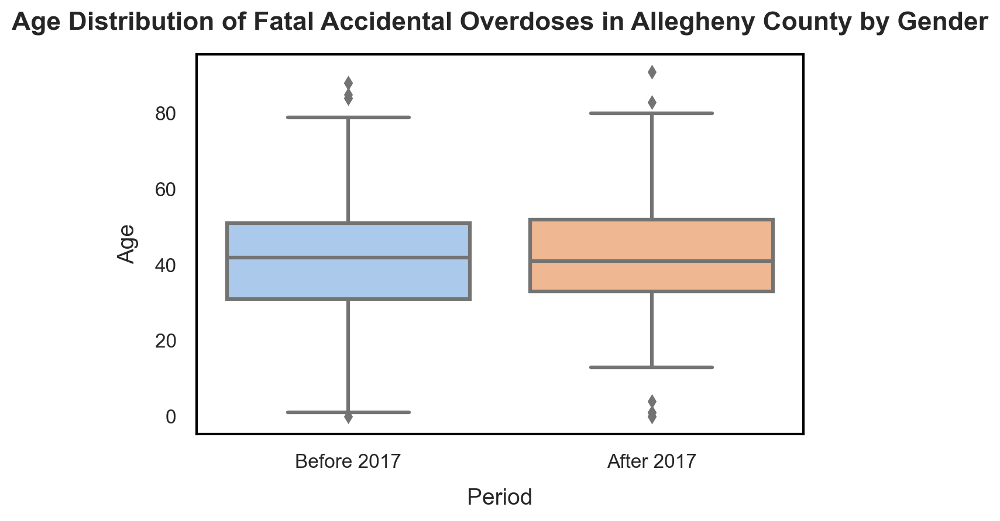

In [106]:

sns.set_style("white")

ax = sns.boxplot(x=target_cat, y='Age', data=age_gender_race_df, palette="pastel")


ax.set_facecolor('white')
ax.grid(False)
ax.spines['right'].set_visible(True)
ax.spines['top'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

ax.spines['right'].set_color('black')
ax.spines['top'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')

ax.spines['right'].set_linewidth(1.5)
ax.spines['top'].set_linewidth(1.5)
ax.spines['bottom'].set_linewidth(1.5)
ax.spines['left'].set_linewidth(1.5)


ax.set_title('Age Distribution of Fatal Accidental Overdoses in Allegheny County by Gender',
             fontsize=16, fontweight='bold', pad=15)

ax.set_xlabel(target_cat, fontsize=14, labelpad=10)
ax.set_ylabel('Age', fontsize=14, labelpad=10)


ax.tick_params(axis='both', labelsize=12)


plt.tight_layout()
plt.show()


<b> Observartion: </b> Comparing the age distribution of Female and Males revels no significant changes in the average of the cases which is around 40.


## Race trend

<b> Observation: </b> The following shows the time series for the number of incidence with different trends each trend represent a race in the period between 2007 and 2022. Generally, we can see that the number of accidents is noticeably higher for the white race followed by the black race. However, the number of cases is hardly noticeable for other races.

We can see a stable trend between the periods between 2007 and 2014 then there is a steep increase for the white race trend where the maximum number is around 650 cases in 2017. After that the trend decreases suddenly and continues with is stable increase before it decreases in 2022. The trend for the black race is majorly less than the white race as it roughly represents roughly 15% present of the white cases in the beginning. Even though the trend for the black race increased by around 50% in the period between 2015 and 2016, the difference between the black race and the white race still carries the same difference percentage which is 15% large. However, this difference starts to shrink as the trend for the white race cases decreases and the black race cases increase to reach around 45% in 2022. 

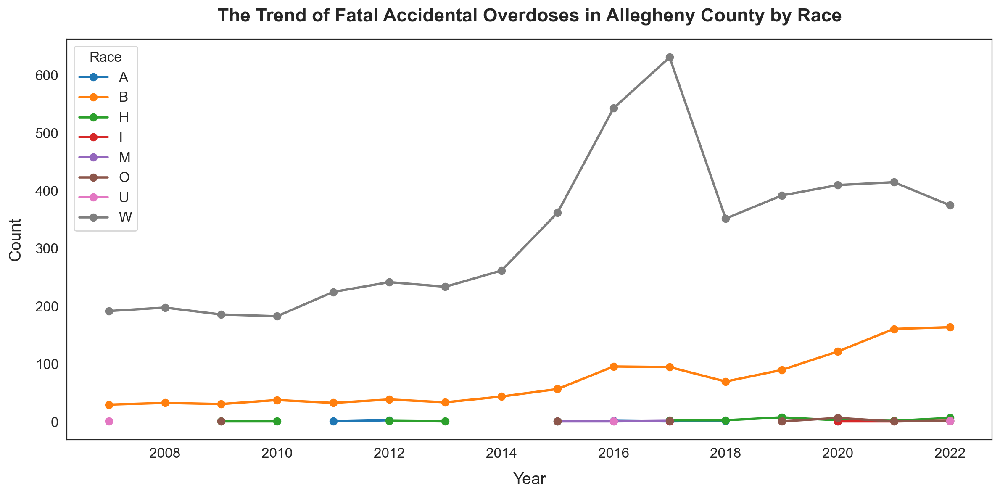

In [40]:



sns.set_style("white")


ax = accident_df.groupby(["case_year", "race"]).count()["age"].unstack().plot(figsize=(12, 6), marker='o', linewidth=2)


ax.set_facecolor('white')
ax.grid(False)



ax.set_title('The Trend of Fatal Accidental Overdoses in Allegheny County by Race', 
             fontsize=16, fontweight='bold', pad=15)
ax.set_xlabel('Year', fontsize=14, labelpad=10)
ax.set_ylabel('Count', fontsize=14, labelpad=10)


ax.legend(title="Race", fontsize=12, title_fontsize=12, loc="upper left")


ax.tick_params(axis='both', labelsize=12)


plt.tight_layout()
plt.show()


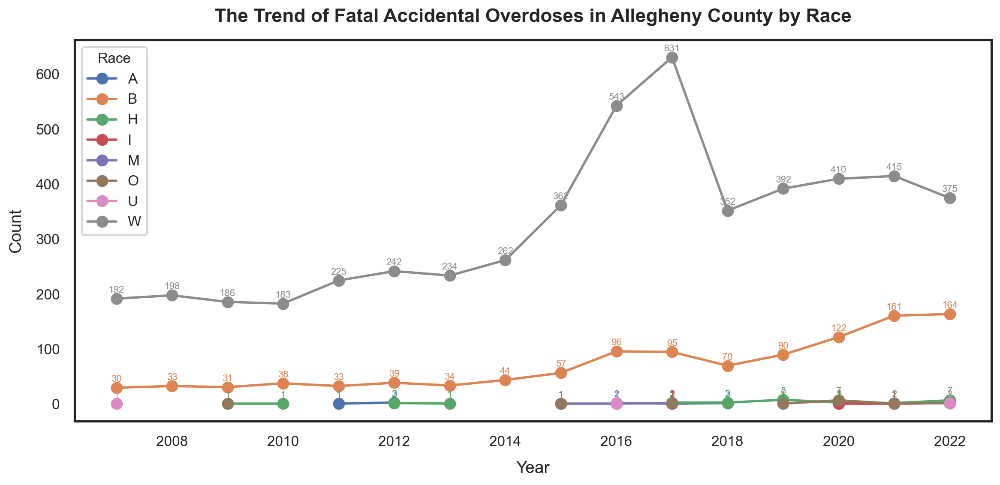

In [70]:



sns.set_style("white")


data = accident_df.groupby(["case_year", "race"]).count()["age"].unstack()


fig, ax = plt.subplots(figsize=(12, 6))
data.plot(ax=ax, marker='o', linewidth=2)


ax.set_facecolor('white')
ax.grid(False)
ax.set_title('The Trend of Fatal Accidental Overdoses in Allegheny County by Race', fontsize=16, fontweight='bold', pad=15)
ax.set_xlabel('Year', fontsize=14, labelpad=10)
ax.set_ylabel('Count', fontsize=14, labelpad=10)
ax.legend(title="Race", fontsize=12, title_fontsize=12, loc="upper left")
ax.tick_params(axis='both', labelsize=12)


for line in ax.lines:
    color = line.get_color()  
    for x, y in zip(line.get_xdata(), line.get_ydata()):
        label = "{:.0f}".format(y)
        ax.annotate(label, (x, y), textcoords="offset points", xytext=(0,5), ha='center', fontsize=8, color=color)


plt.tight_layout()
plt.show()


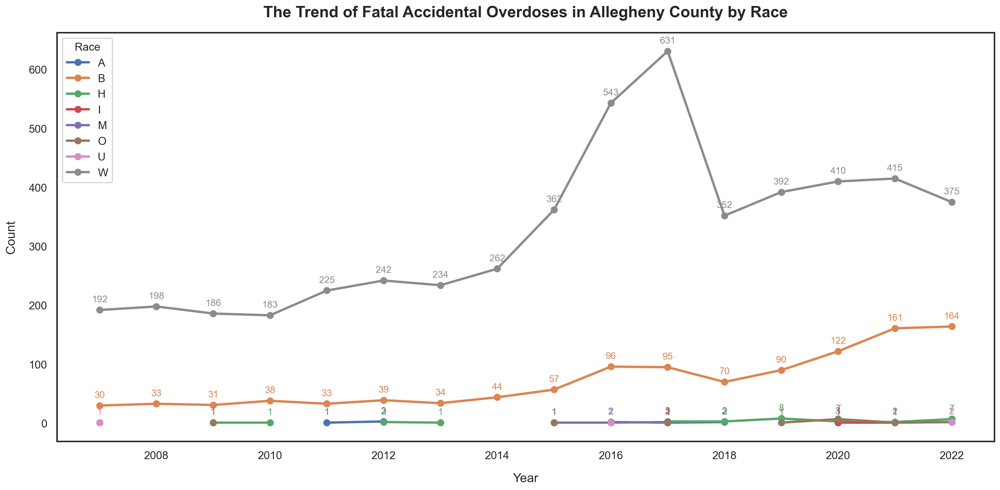

In [75]:



sns.set_style("white")


data = accident_df.groupby(["case_year", "race"]).count()["age"].unstack()


fig, ax = plt.subplots(figsize=(18, 9))  
data.plot(ax=ax, marker='o', linewidth=3, markersize=8) 


ax.set_facecolor('white')
ax.grid(False)
ax.set_title('The Trend of Fatal Accidental Overdoses in Allegheny County by Race', fontsize=20, fontweight='bold', pad=20)
ax.set_xlabel('Year', fontsize=16, labelpad=15)
ax.set_ylabel('Count', fontsize=16, labelpad=15)
ax.legend(title="Race", fontsize=14, title_fontsize=14, loc="upper left")
ax.tick_params(axis='both', labelsize=14)


for line in ax.lines:
    color = line.get_color()  
    for x, y in zip(line.get_xdata(), line.get_ydata()):
        label = "{:.0f}".format(y)
        ax.annotate(label, (x, y), xytext=(0, 10), textcoords="offset points", ha='center', fontsize=12, color=color)


plt.tight_layout()
plt.show()


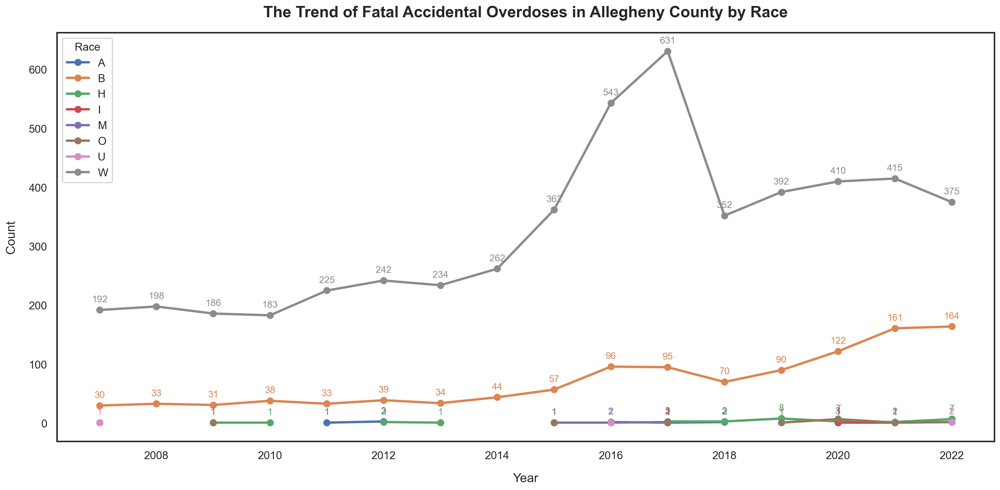

In [76]:

sns.set_style("white")


data = accident_df.groupby(["case_year", "race"]).count()["age"].unstack()


fig, ax = plt.subplots(figsize=(18, 9)) 
data.plot(ax=ax, marker='o', linewidth=3, markersize=8)  

# Set plot aesthetics
ax.set_facecolor('white')
ax.grid(False)
ax.set_title('The Trend of Fatal Accidental Overdoses in Allegheny County by Race', fontsize=20, fontweight='bold', pad=20)
ax.set_xlabel('Year', fontsize=16, labelpad=15)
ax.set_ylabel('Count', fontsize=16, labelpad=15)
ax.legend(title="Race", fontsize=14, title_fontsize=14, loc="upper left")
ax.tick_params(axis='both', labelsize=14)


for line in ax.lines:
    color = line.get_color() 
    for x, y in zip(line.get_xdata(), line.get_ydata()):
        label = "{:.0f}".format(y)
        ax.annotate(label, (x, y), xytext=(0, 10), textcoords="offset points", ha='center', fontsize=12, color=color)


plt.tight_layout()
plt.show()


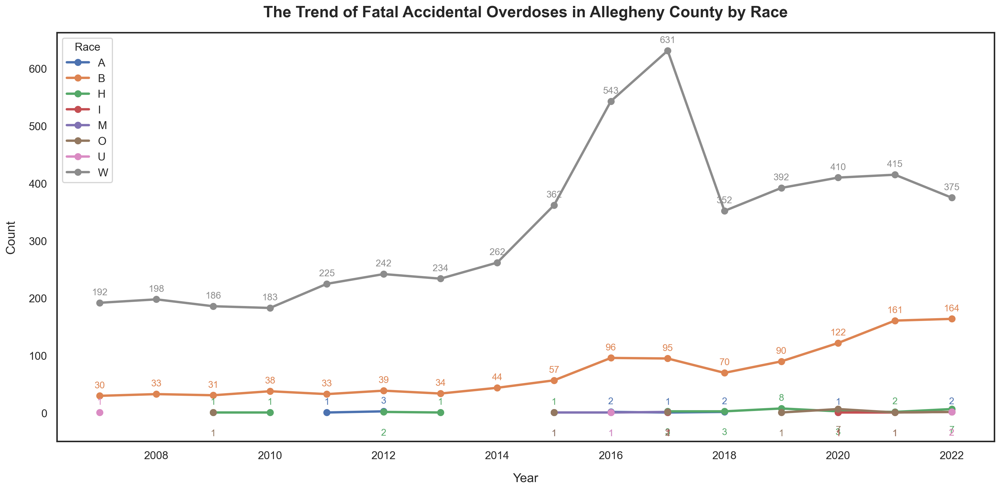

In [80]:

sns.set_style("white")


data = accident_df.groupby(["case_year", "race"]).count()["age"].unstack()

fig, ax = plt.subplots(figsize=(18, 9))
data.plot(ax=ax, marker='o', linewidth=3, markersize=8)


ax.set_facecolor('white')
ax.grid(False)
ax.set_title('The Trend of Fatal Accidental Overdoses in Allegheny County by Race', fontsize=20, fontweight='bold', pad=20)
ax.set_xlabel('Year', fontsize=16, labelpad=15)
ax.set_ylabel('Count', fontsize=16, labelpad=15)
ax.legend(title="Race", fontsize=14, title_fontsize=14, loc="upper left")
ax.tick_params(axis='both', labelsize=14)


def adjust_annotation_position(ax, x, y, text, color, previous_points):
    default_offset = 10
    stagger_upwards = True

    for px, py in previous_points:
        if abs(px - x) < 1 and abs(py - y) < 10:  
            stagger_upwards = not stagger_upwards
            break

    if stagger_upwards:
        vertical_offset = default_offset
    else:
        vertical_offset = -default_offset - 20 

    ax.annotate(text, (x, y), xytext=(0, vertical_offset), textcoords="offset points",
                ha='center', fontsize=12, color=color)
    previous_points.append((x, y))


previous_points = []
for line in ax.lines:
    color = line.get_color()
    for x, y in zip(line.get_xdata(), line.get_ydata()):
        label = "{:.0f}".format(y)
        adjust_annotation_position(ax, x, y, label, color, previous_points)


min_count = data.min().min()
extra_space = 50 
ax.set_ylim([min_count - extra_space, ax.get_ylim()[1]])


plt.tight_layout()
plt.show()


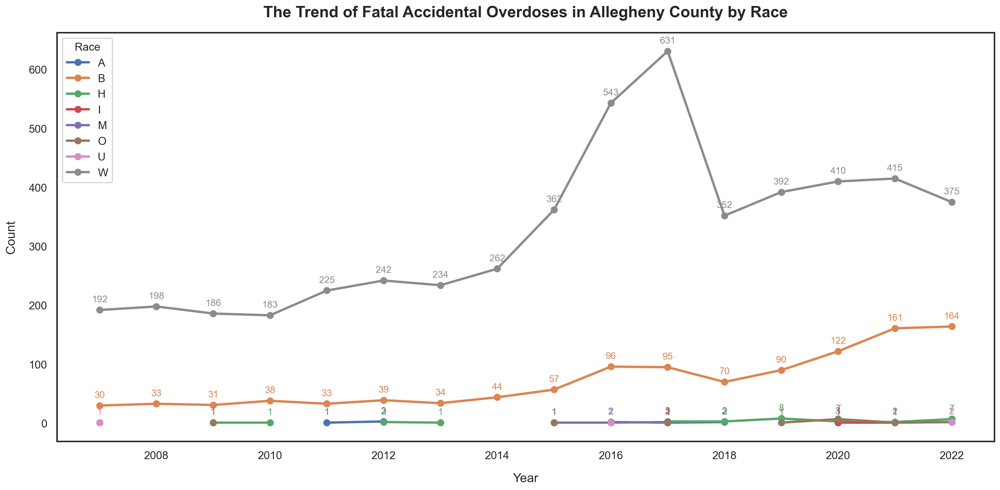

In [84]:

sns.set_style("white")


data = accident_df.groupby(["case_year", "race"]).count()["age"].unstack()


fig, ax = plt.subplots(figsize=(18, 9))
data.plot(ax=ax, marker='o', linewidth=3, markersize=8)


ax.set_facecolor('white')
ax.grid(False)
ax.set_title('The Trend of Fatal Accidental Overdoses in Allegheny County by Race', fontsize=20, fontweight='bold', pad=20)
ax.set_xlabel('Year', fontsize=16, labelpad=15)
ax.set_ylabel('Count', fontsize=16, labelpad=15)
ax.legend(title="Race", fontsize=14, title_fontsize=14, loc="upper left")
ax.tick_params(axis='both', labelsize=14)


def should_annotate(ax, x, y, threshold=10):
    for annotation in ax.texts:
        x2, y2 = annotation.get_position()
        if abs(x - x2) < threshold and abs(y - y2) < threshold:
            return False
    return True


for line in ax.lines:
    color = line.get_color()
    for x, y in zip(line.get_xdata(), line.get_ydata()):
        if should_annotate(ax, x, y):
            label = "{:.0f}".format(y)
            ax.annotate(label, (x, y), xytext=(0, 10), textcoords="offset points", ha='center', fontsize=12, color=color)


plt.tight_layout()
plt.show()


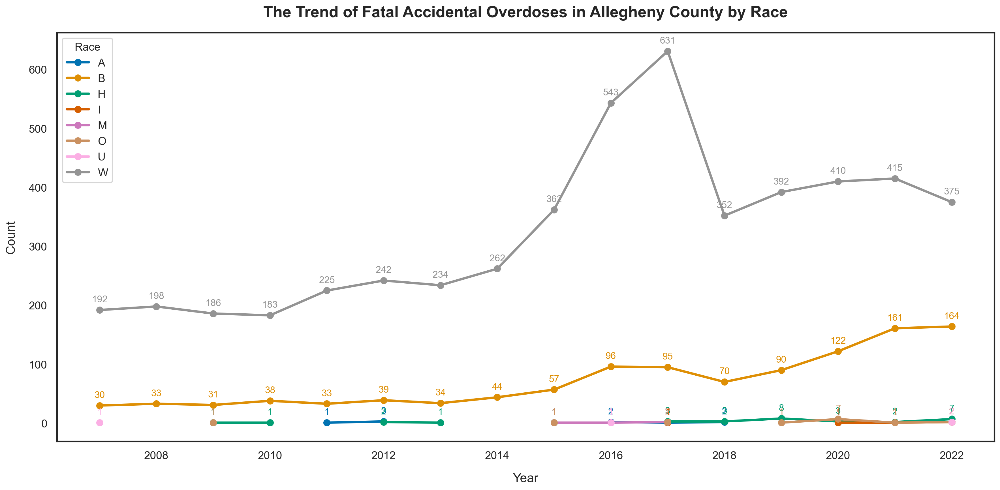

In [115]:

races_order = data.columns.tolist()  


palette = sns.color_palette("colorblind", n_colors=len(races_order))

sns.set_style("white")


data = accident_df.groupby(["case_year", "race"]).count()["age"].unstack()


palette = sns.color_palette("colorblind", n_colors=data.shape[1])


fig, ax = plt.subplots(figsize=(18, 9))
data.plot(ax=ax, marker='o', linewidth=3, markersize=8, color=palette)

# Set plot aesthetics
ax.set_facecolor('white')
ax.grid(False)
ax.set_title('The Trend of Fatal Accidental Overdoses in Allegheny County by Race', fontsize=20, fontweight='bold', pad=20)
ax.set_xlabel('Year', fontsize=16, labelpad=15)
ax.set_ylabel('Count', fontsize=16, labelpad=15)
ax.legend(title="Race", fontsize=14, title_fontsize=14, loc="upper left")
ax.tick_params(axis='both', labelsize=14)


for line, color in zip(ax.lines, palette):
    for x, y in zip(line.get_xdata(), line.get_ydata()):
        label = "{:.0f}".format(y)
        ax.annotate(label, (x, y), xytext=(0, 10), textcoords="offset points", ha='center', fontsize=12, color=color)


plt.tight_layout()
plt.show()




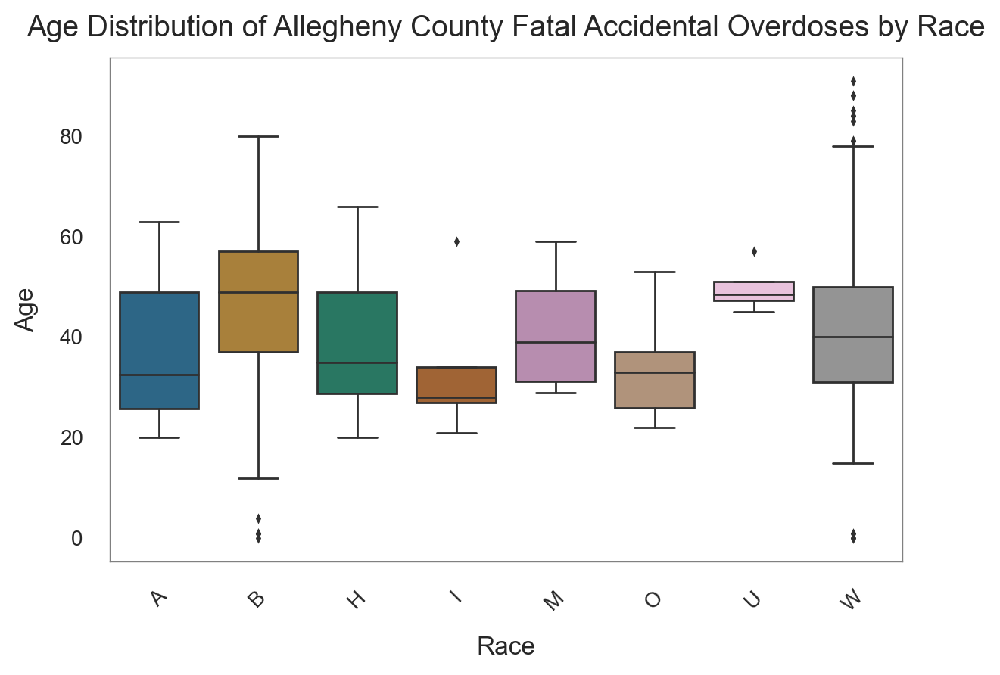

In [123]:

sns.set_style("whitegrid", {'axes.grid': False})  # Turn off grid lines for a cleaner look

sns.boxplot(x='Race', y='Age', data=age_gender_race_df, palette=palette, order=races_order,
            linewidth=1, 
            fliersize=2,  
            saturation=0.5)  


plt.title('Age Distribution of Allegheny County Fatal Accidental Overdoses by Race', fontsize=14, fontweight='normal', pad=10)
plt.xlabel('Race', fontsize=12, labelpad=10)
plt.ylabel('Age', fontsize=12, labelpad=10)


plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)


plt.tight_layout()


for spine in plt.gca().spines.values():
    spine.set_visible(True)
    spine.set_linewidth(0.5)
    spine.set_color('gray')

plt.show()


In [112]:
age_gender_race_df

,Age,Sex,Race,Period
0,58,F,W,Before 2017
1,33,M,B,Before 2017
2,47,M,W,Before 2017
3,33,M,W,Before 2017
4,46,F,W,Before 2017
...,...,...,...,...
6408,23,F,W,After 2017
6409,35,M,W,After 2017
6410,38,M,W,After 2017
6411,51,M,W,After 2017


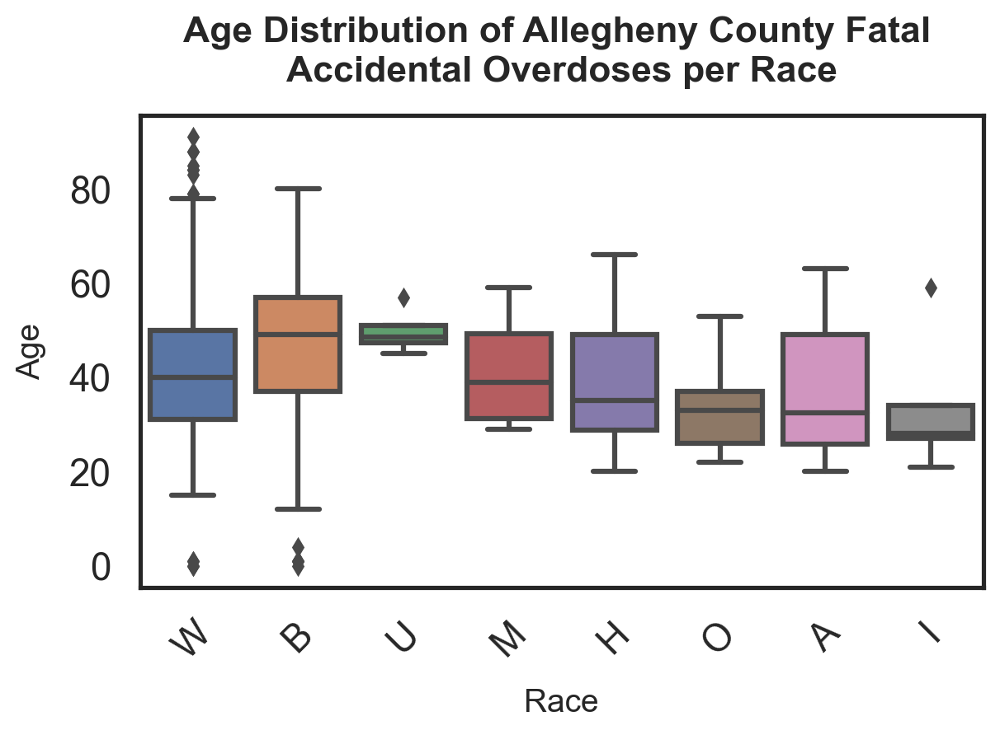

In [83]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define your target category and title
target_cat = 'Race' 
title = 'Age Distribution of Allegheny County Fatal \nAccidental Overdoses per {}'.format(target_cat)

# Create the boxplot with default Seaborn palette
sns.boxplot(x=target_cat, y='Age', data=age_gender_race_df)

# Set the plot title and other aesthetics
plt.title(title, fontsize=16, fontweight='bold', pad=15)
plt.xlabel(target_cat, fontsize=14, labelpad=10)
plt.ylabel('Age', fontsize=14, labelpad=10)
plt.xticks(rotation=45)

# Adjust the layout and show the plot
plt.tight_layout()
plt.show()



<b> Observartion: </b> However, comparing the age distribution of different races show that both the range and mean of the cases vary highly accross different races. For example, Indians, have lowest mean (around 30) while Blacks have the highest mean (around 50). 


# Allegheny county fatal accidental overdoses reasons (factors)

## Frequency of reasons involved in an overdose

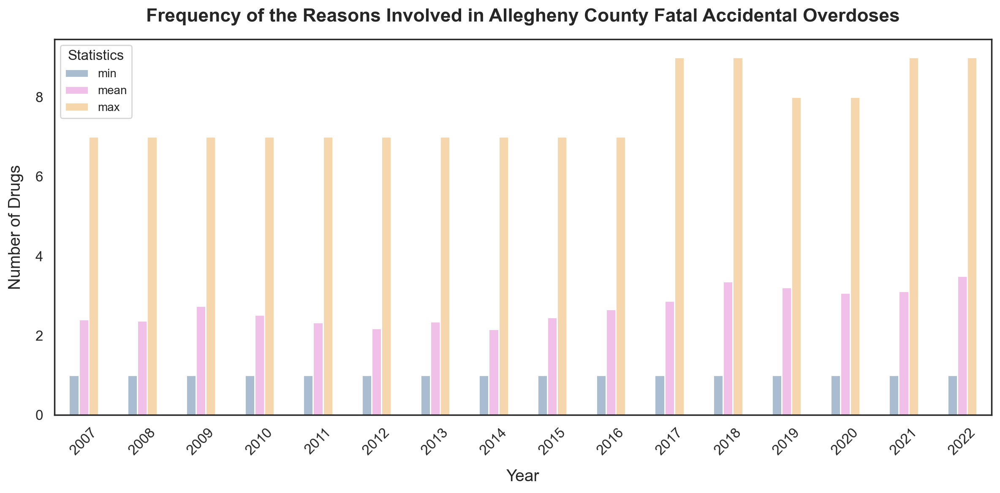

In [156]:

sns.set(style="white")


title = 'Frequency of the Reasons Involved in Allegheny County Fatal Accidental Overdoses'
df_copy = accident_df.copy()
df_copy["count_drug"] = df_copy.iloc[:, 6:16].notna().sum(axis=1)
agg_df = df_copy.groupby(df_copy["case_year"])["count_drug"].agg(['min', 'mean', 'max'])


colors = ["#a9bcd0", "#f1c0e8", "#f6d6ad"]  

# Plot creation
agg_df.plot(kind="bar", figsize=(12, 6), color=colors, xlabel="Year", ylabel="Average Number of Drugs Involved")

plt.title(title, fontsize=16, fontweight='bold', pad=15)
plt.xlabel('Year', fontsize=14, labelpad=10)
plt.ylabel('Number of Drugs', fontsize=14, labelpad=10)


plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)


plt.legend(title='Statistics', title_fontsize=12, fontsize=10)




plt.tight_layout()
plt.show()


<b> Observation: </b> Each overdose case, can have up to 10 reasons reported by the authotrities. Comparing the reasons involved in each overdose over time shows that the maximum trend does not change as it has a value of 10. However, we can see some minor fluctuation in the mean and the minimum values where the mean is in a range between 7 and 8 and the minimum trend is stable between 2007 and 2016 with a value of 3. After that, there is a minor decrease between 2017 and 2022 before it returns to 3 again.



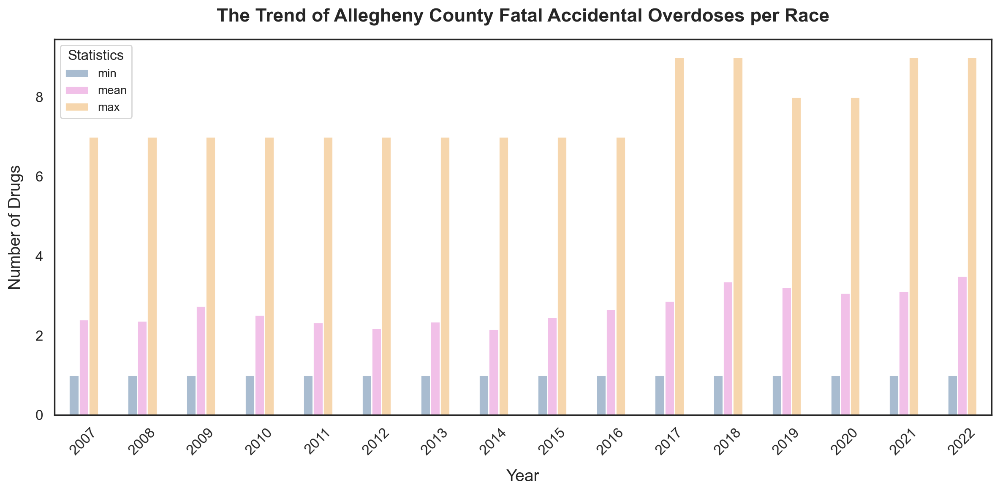

In [127]:

sns.set(style="white")


df_copy = accident_df.copy()
df_copy["count_drug"] = df_copy.iloc[:, 6:16].notna().sum(axis=1)


agg_df = df_copy.groupby(df_copy["case_year"])["count_drug"].agg(['min', 'mean', 'max'])


colors = ["#a9bcd0", "#f1c0e8", "#f6d6ad"] 


agg_df.plot(kind="bar", figsize=(12, 6), color=colors, xlabel="Year", ylabel="Average Number of Drugs Involved")


plt.title(title, fontsize=16, fontweight='bold', pad=15)
plt.xlabel('Year', fontsize=14, labelpad=10)
plt.ylabel('Number of Drugs', fontsize=14, labelpad=10)


plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)


plt.legend(title='Statistics', title_fontsize=12, fontsize=10)


plt.tight_layout()
plt.show()


## Word Cloud representation per period

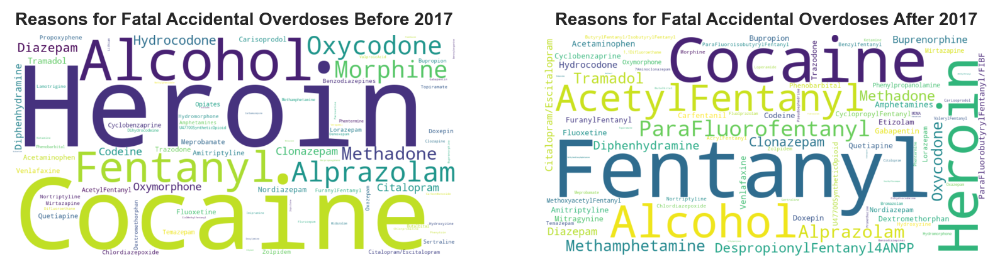

In [152]:
def reasons_list_builder(years, df):
    
    total = []
    
    for year in years:       
        df_year = df[df['case_year'] == year]
        df_year = df_year.iloc[:,6:16]
        
        for index, row in df_year.iterrows():
            total.extend(row.values.flatten().tolist())
            
    newList = [element.strip().replace("_", "").replace("-", "").replace(" ", "")  
               for element in total if str(element) != "nan"]
    newList
    return newList

years_before_list = list(range(accident_df['case_year'].min(), selected_year))
before_reasons_list = reasons_list_builder(years_before_list, accident_df)

years_after_list = list(range(selected_year, accident_df['case_year'].max()+1))
after_reasons_list = reasons_list_builder(years_after_list, accident_df)


title1 = 'Reasons for Fatal Accidental Overdoses Before {}'.format(selected_year)
title2 = 'Reasons for Fatal Accidental Overdoses After {}'.format(selected_year)


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 8))


word_could_dict1=Counter(before_reasons_list)
wordcloud1 = WordCloud(width = 1000, height = 500,
                       background_color = 'white',
                       collocations=True).generate_from_frequencies(word_could_dict1)

word_could_dict2=Counter(after_reasons_list)
wordcloud2 = WordCloud(width = 1000, height = 500,
                       background_color = 'white',
                       collocations=True).generate_from_frequencies(word_could_dict2)

ax1.axis('off')
ax2.axis('off')
ax1.set_title(title1, fontdict={'fontsize': '10', 'fontweight': 'bold'})
ax2.set_title(title2, fontdict={'fontsize': '10', 'fontweight': 'bold'})

ax1.imshow(wordcloud1, interpolation='bilinear')
ax2.imshow(wordcloud2, interpolation='bilinear')


plt.show()

wordcloud1.to_file("WordCloud_Before_{}.png".format(selected_year))
wordcloud2.to_file("WordCloud_After_{}.png".format(selected_year))


<b> Observartion: </b> In order to find the main reasons for fatal accidental overdoses in Allegheny county before and after 2017, we plotted the word cloud representation of the overdoses reasons.
In the years before 2017, we see that Cocaine, Heroin, and Alcohol are the most prevalent reasons. However, Fentanyl, Cocaine, and Heroin are the main ovedoses reasons for the years after 2017.

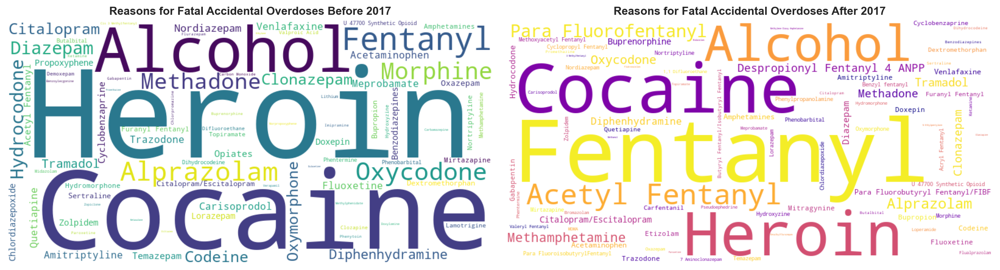

In [129]:


def reasons_list_builder(years, df):
    total = []
    for year in years:       
        df_year = df[df['case_year'] == year]
        df_year = df_year.iloc[:,6:16]
        for index, row in df_year.iterrows():
            total.extend(row.values.flatten().tolist())
            
    newList = [element.strip().replace("_", " ").replace("-", " ").replace(" ", " ")  
               for element in total if str(element) != "nan"]
    return newList

# Generate lists of reasons
years_before_list = list(range(accident_df['case_year'].min(), selected_year))
before_reasons_list = reasons_list_builder(years_before_list, accident_df)

years_after_list = list(range(selected_year, accident_df['case_year'].max() + 1))
after_reasons_list = reasons_list_builder(years_after_list, accident_df)

# Titles for the word clouds
title1 = 'Reasons for Fatal Accidental Overdoses Before {}'.format(selected_year)
title2 = 'Reasons for Fatal Accidental Overdoses After {}'.format(selected_year)

# Create the figure for the word clouds
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))

# Generate word clouds with improved color contrast
word_could_dict1 = Counter(before_reasons_list)
wordcloud1 = WordCloud(width=800, height=400, background_color='white', colormap='viridis', collocations=False).generate_from_frequencies(word_could_dict1)

word_could_dict2 = Counter(after_reasons_list)
wordcloud2 = WordCloud(width=800, height=400, background_color='white', colormap='plasma', collocations=False).generate_from_frequencies(word_could_dict2)

# Plotting word clouds
ax1.imshow(wordcloud1, interpolation='bilinear')
ax1.axis('off')
ax1.set_title(title1, fontdict={'fontsize': 12, 'fontweight': 'bold'})

ax2.imshow(wordcloud2, interpolation='bilinear')
ax2.axis('off')
ax2.set_title(title2, fontdict={'fontsize': 12, 'fontweight': 'bold'})

# Display the plot
plt.tight_layout()
plt.show()


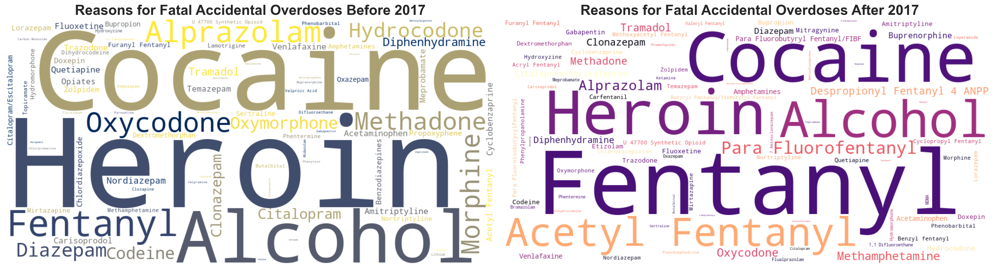

In [146]:
from wordcloud import WordCloud
from collections import Counter
import matplotlib.pyplot as plt

def reasons_list_builder(years, df):
    total = []
    for year in years:       
        df_year = df[df['case_year'] == year]
        df_year = df_year.iloc[:,6:16]
        for index, row in df_year.iterrows():
            total.extend(row.values.flatten().tolist())
            
    newList = [element.strip().replace("_", " ").replace("-", " ").replace(" ", " ")  
               for element in total if str(element) != "nan"]
    return newList

# Generate lists of reasons
years_before_list = list(range(accident_df['case_year'].min(), selected_year))
before_reasons_list = reasons_list_builder(years_before_list, accident_df)

years_after_list = list(range(selected_year, accident_df['case_year'].max() + 1))
after_reasons_list = reasons_list_builder(years_after_list, accident_df)

# Titles for the word clouds
title1 = 'Reasons for Fatal Accidental Overdoses Before {}'.format(selected_year)
title2 = 'Reasons for Fatal Accidental Overdoses After {}'.format(selected_year)

# Create the figure for the word clouds
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))  # Increased figure size

# Generate word clouds with colorblind-friendly palettes
word_could_dict1 = Counter(before_reasons_list)
wordcloud1 = WordCloud(width=1000, height=500, background_color='white', colormap='cividis', collocations=False).generate_from_frequencies(word_could_dict1)

word_could_dict2 = Counter(after_reasons_list)
wordcloud2 = WordCloud(width=1000, height=500, background_color='white', colormap='magma', collocations=False).generate_from_frequencies(word_could_dict2)

# Plotting word clouds
ax1.imshow(wordcloud1, interpolation='bilinear')
ax1.axis('off')
ax1.set_title(title1, fontdict={'fontsize': 20, 'fontweight': 'bold'})

ax2.imshow(wordcloud2, interpolation='bilinear')
ax2.axis('off')
ax2.set_title(title2, fontdict={'fontsize': 20, 'fontweight': 'bold'})

# Display and save the plot
plt.tight_layout()
plt.show()




In [136]:
import os


desktop_path = '/Users/arezoufarzaneh/Desktop/'  # Change this according to your OS and username

# File names
file_name1 = "WordCloud_Beforee_{}.png".format(selected_year)
file_name2 = "WordCloud_Afterrr_{}.png".format(selected_year)

# Full file paths
full_file_path1 = os.path.join(desktop_path, file_name1)
full_file_path2 = os.path.join(desktop_path, file_name2)

# Save the word clouds to your desktop
wordcloud1.to_file(full_file_path1)
wordcloud2.to_file(full_file_path2)


IndentationError: expected an indented block after function definition on line 6 (1115264455.py, line 10)